## Name : - Sandeep Sharma
Date : - 10/24/2020

### Medical Appointment No Shows

### Context
No-shows, or patients who miss their scheduled appointments are common and costly to healthcare institutions. A US study found that up to 30% of patients miss their appointments, and $150 billion is lost every year because of them. Identifying potential no-shows can help healthcare institutions pursue targeted interventions (e.g. reminder phone calls, double-book an appointment slot) to reduce no-shows and financial loss.

#### Content
The Kaggle dataset is comprised of 110,527 appointment records from public healthcare institutions in Brazil. The appointments occurred across a 6-week period in 2016. Please see the variable descriptions below:

Target variable(s)
 - No show (binary: Yes, No)

Identifiers
 - Patient ID (non-unique)
 - Appointment ID (non-unique)
 
Patient Information
 - Age (range: -1 to 115)
 - Gender (binary: M, F)
 - Hypertension (binary: 1,0)
 - Diabetes (binary: 1,0)
 - Alcoholism (binary: 1,0)
 - Handicap (range: 0 to 4)
 - Scholarship (binary: 1,0)
 - SMS received (binary: 1,0)

Appointment Information
 - Schedule Day (YYYY-MM-DD TZHH-MM-SSZ)
 - Appointment Day (YYYY-MM-DD TZHH-MM-SSZ)
 - Neighbourhood (category)



#### Inspiration
 - What are the contributing factors for missed medical appointments?
 - Is it possible to predict "no-shows" for medical appointments?
 - What is the ratio of patients who miss appoints to those who don't?
 - Are men or women more likely to be "no-shows"?
 - Are there trends among what month/day/hour patients do not show up?
 - What is the age distribution of patients?
 - Does age affect a patient's liklihood to show up (or not) for an appointment?
 - What relationships (if any) exist between clinical conditions, such as hypertension, and liklihood to miss an appointment?

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import plotly.express as px

In [2]:
df = pd.read_csv('Medical_No_Shows.csv', encoding='latin-1')

In [3]:
df.describe()

,PatientId,AppointmentID,Age,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received
count,1.105270e+05,1.105270e+05,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000,110527.000000
mean,1.474963e+14,5.675305e+06,37.088874,0.098266,0.197246,0.071865,0.030400,0.022248,0.321026
std,2.560949e+14,7.129575e+04,23.110205,0.297675,0.397921,0.258265,0.171686,0.161543,0.466873
min,3.921800e+04,5.030230e+06,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.172615e+12,5.640286e+06,18.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,3.173180e+13,5.680573e+06,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,9.439170e+13,5.725524e+06,55.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,9.999820e+14,5.790484e+06,115.000000,1.000000,1.000000,1.000000,1.000000,4.000000,1.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110527 entries, 0 to 110526
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   PatientId       110527 non-null  float64
 1   AppointmentID   110527 non-null  int64  
 2   Gender          110527 non-null  object 
 3   ScheduledDay    110527 non-null  object 
 4   AppointmentDay  110527 non-null  object 
 5   Age             110527 non-null  int64  
 6   Neighbourhood   110527 non-null  object 
 7   Scholarship     110527 non-null  int64  
 8   Hipertension    110527 non-null  int64  
 9   Diabetes        110527 non-null  int64  
 10  Alcoholism      110527 non-null  int64  
 11  Handcap         110527 non-null  int64  
 12  SMS_received    110527 non-null  int64  
 13  No-show         110527 non-null  object 
dtypes: float64(1), int64(8), object(5)
memory usage: 11.8+ MB


In [5]:
df.duplicated().sum()

0

In [6]:
# Patient with multiple appointments
df.PatientId.duplicated().sum()

48783

In [7]:
# For Duplicate appointments
df.AppointmentID.duplicated().sum()

0

In [8]:
df.nunique()

PatientId          61744
AppointmentID     110527
Gender                 2
ScheduledDay       28590
AppointmentDay        27
Age                  104
Neighbourhood         81
Scholarship            2
Hipertension           2
Diabetes               2
Alcoholism             2
Handcap                5
SMS_received           2
No-show                2
dtype: int64

In [9]:
# Unique values for each column?
for col in df.iloc[:, np.r_[2,5,7:14]].columns:
    print(f'{col}   ==>  ', sorted(df[f'{col}'].unique()), '\n')

Gender   ==>   ['F', 'M'] 

Age   ==>   [-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 102, 115] 

Scholarship   ==>   [0, 1] 

Hipertension   ==>   [0, 1] 

Diabetes   ==>   [0, 1] 

Alcoholism   ==>   [0, 1] 

Handcap   ==>   [0, 1, 2, 3, 4] 

SMS_received   ==>   [0, 1] 

No-show   ==>   ['No', 'Yes'] 



In [10]:
np.sort(df['Age'].unique())

array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 102, 115],
      dtype=int64)

In [11]:
#age for negative numbers
df.query('Age < 0')

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighbourhood,Scholarship,Hipertension,Diabetes,Alcoholism,Handcap,SMS_received,No-show
99832,4.659430e+14,5775010,F,6/6/2016 4:58,6/5/2016 20:00,-1,ROMÃO,0,0,0,0,0,0,No


In [12]:
# Converting datatype for 'ScheduledDay' and 'AppointmentDay' to datetime
df.ScheduledDay = pd.to_datetime(df.ScheduledDay)
df.AppointmentDay = pd.to_datetime(df.AppointmentDay)

In [13]:
# Renaming misspelled columns
df = df.rename(columns={'Neighbourhood': 'Neighborhood','Hipertension': 'Hypertension', 'Handcap': 'Handicap'})

In [14]:
change_code = {'Yes': 'No-show', 'No':'Show'}
df['No-show'] = [change_code[item] for item in df['No-show']] 

In [15]:
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighborhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No-show
0,2.987250e+13,5642903,F,2016-04-29 14:38:00,2016-04-28 20:00:00,62,JARDIM DA PENHA,0,1,0,0,0,0,Show
1,5.589980e+14,5642503,M,2016-04-29 12:08:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,0,0,0,0,0,Show
2,4.262960e+12,5642549,F,2016-04-29 12:19:00,2016-04-28 20:00:00,62,MATA DA PRAIA,0,0,0,0,0,0,Show
3,8.679510e+11,5642828,F,2016-04-29 13:29:00,2016-04-28 20:00:00,8,PONTAL DE CAMBURI,0,0,0,0,0,0,Show
4,8.841190e+12,5642494,F,2016-04-29 12:07:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,1,1,0,0,0,Show


In [16]:
# Dropping age less than 0
#df.drop(df.query('Age < 0').index, axis=0, inplace=True)
df.drop(df[df.Age < 0].index, inplace=True)

In [17]:
df.query('Age < 0')

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighborhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No-show


In [18]:
# Converting data types for all categorical variables
df[['Gender', 'SMS_received', 'Hypertension', 'No-show']] = df[['Gender', 'SMS_received', 'Hypertension', 'No-show']].astype('category')

In [19]:
# WaitingDays = number of days between scheduled and appointment dates
df['WaitingDays'] = df['AppointmentDay'] - df['ScheduledDay']

In [20]:
df['Appointment_WeekDay'] = df[['AppointmentDay']].apply(lambda x: pd.datetime.strftime(x['AppointmentDay'], '%A'), axis=1)

<ipython-input-20-2190f3063235>:1: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  df['Appointment_WeekDay'] = df[['AppointmentDay']].apply(lambda x: pd.datetime.strftime(x['AppointmentDay'], '%A'), axis=1)


In [21]:
df['Schedule_WeekDay'] = df[['ScheduledDay']].apply(lambda x: pd.datetime.strftime(x['ScheduledDay'], '%A'), axis=1)

<ipython-input-21-9ce61bb67050>:1: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  df['Schedule_WeekDay'] = df[['ScheduledDay']].apply(lambda x: pd.datetime.strftime(x['ScheduledDay'], '%A'), axis=1)


In [22]:
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighborhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No-show,WaitingDays,Appointment_WeekDay,Schedule_WeekDay
0,2.987250e+13,5642903,F,2016-04-29 14:38:00,2016-04-28 20:00:00,62,JARDIM DA PENHA,0,1,0,0,0,0,Show,-1 days +05:22:00,Thursday,Friday
1,5.589980e+14,5642503,M,2016-04-29 12:08:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,0,0,0,0,0,Show,-1 days +07:52:00,Thursday,Friday
2,4.262960e+12,5642549,F,2016-04-29 12:19:00,2016-04-28 20:00:00,62,MATA DA PRAIA,0,0,0,0,0,0,Show,-1 days +07:41:00,Thursday,Friday
3,8.679510e+11,5642828,F,2016-04-29 13:29:00,2016-04-28 20:00:00,8,PONTAL DE CAMBURI,0,0,0,0,0,0,Show,-1 days +06:31:00,Thursday,Friday
4,8.841190e+12,5642494,F,2016-04-29 12:07:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,1,1,0,0,0,Show,-1 days +07:53:00,Thursday,Friday


In [23]:
df_grp = df['No-show'].groupby(df['Gender']).value_counts()
df_grp

Gender  No-show
F       Show       57245
        No-show    14594
M       Show       30962
        No-show     7725
Name: No-show, dtype: int64

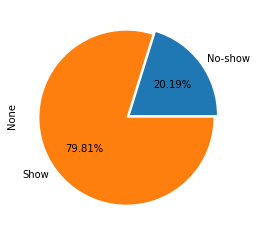

In [24]:
# Pie Chart
df.groupby('No-show').size().plot(kind='pie', autopct='%.2f%%', explode=(0, .05))
plt.show()

In [25]:
fig = px.pie(df, values='PatientId', names='No-show', width=400, height=300)
fig.show()

In [26]:
df['No-show'].value_counts()

Show       88207
No-show    22319
Name: No-show, dtype: int64

Text(0.5, 1.0, 'Male vs Female attendace')

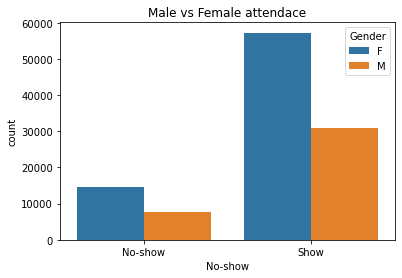

In [27]:
sns.countplot(x=df['No-show'], hue=df['Gender'])
plt.title('Male vs Female attendace')

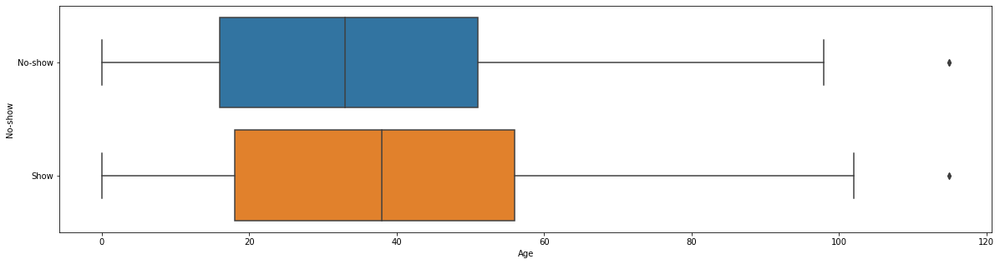

In [28]:
fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(x='Age',y='No-show',data=df)
plt.show()

In [29]:
fig = go.Figure()
fig.add_trace(go.Box(x=df['Age']))
fig.show()

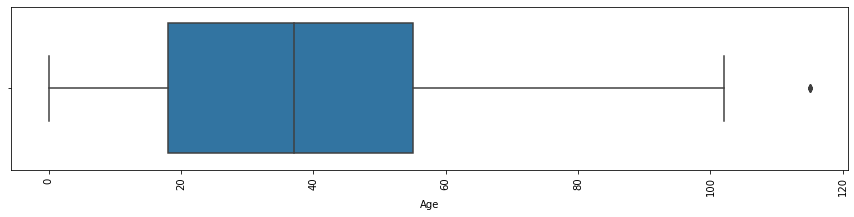

In [30]:
plt.figure(figsize=(15,3))
plt.xticks(rotation=90)
_ = sns.boxplot(x=df['Age'])

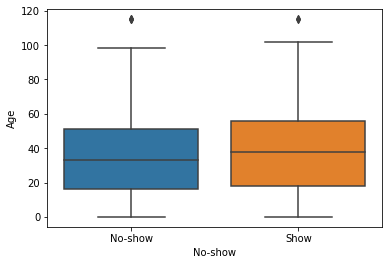

In [31]:
sns.boxplot(x=df['No-show'], y=df['Age'])
plt.show()

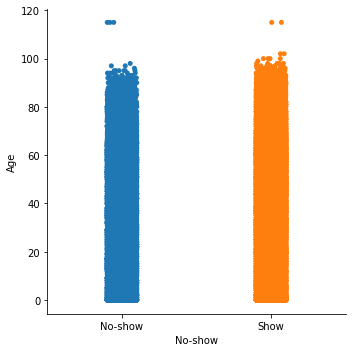

In [32]:
sns.catplot(y='Age',x='No-show',data=df)

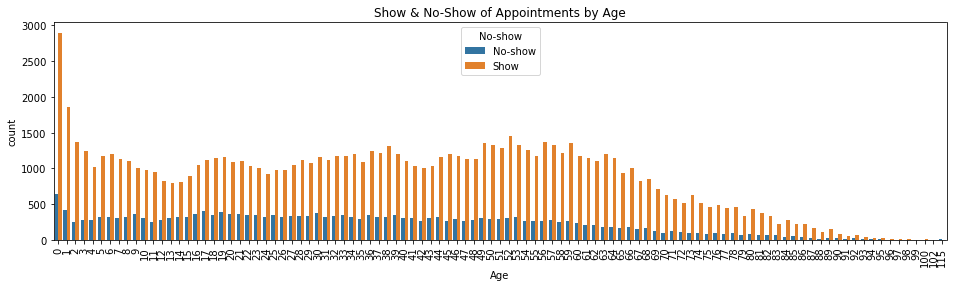

In [33]:
plt.figure(figsize=(16,4))
plt.xticks(rotation=90)
ax = sns.countplot(x=df.Age, hue=df['No-show'])
ax.set_title('Show & No-Show of Appointments by Age')
plt.show()

<Figure size 72x432 with 0 Axes>

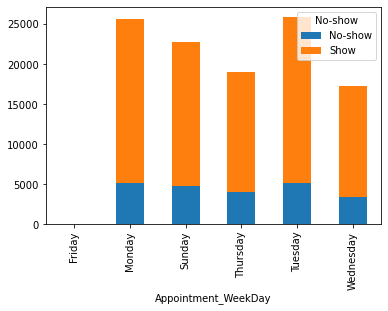

In [34]:
plt.figure(figsize=(1,6))
ct = pd.crosstab(df['Appointment_WeekDay'], df['No-show'])
ct.plot.bar(stacked=True)
plt.show()

In [35]:
from collections import Counter
x=df['Appointment_WeekDay']
print(Counter(x))

Counter({'Tuesday': 25867, 'Monday': 25640, 'Sunday': 22714, 'Thursday': 19019, 'Wednesday': 17247, 'Friday': 39})


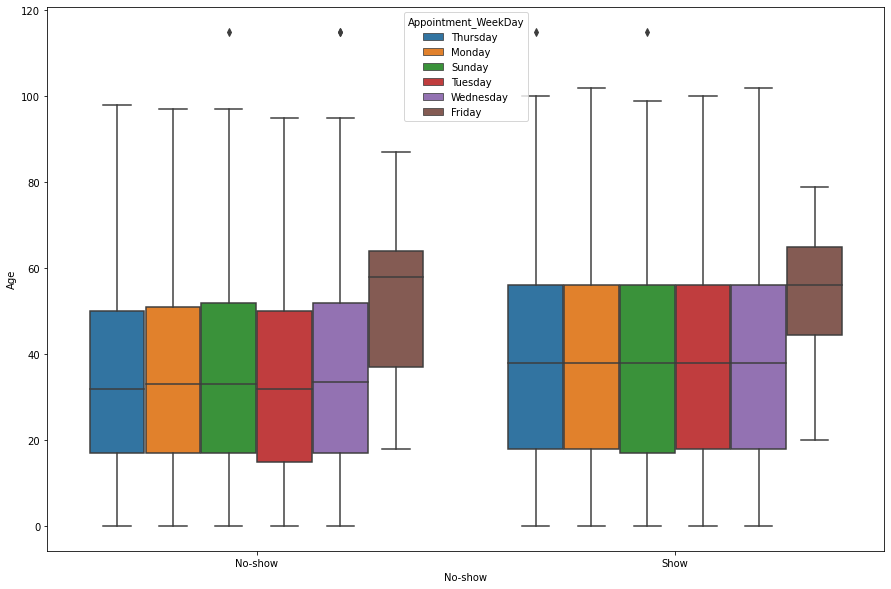

In [36]:
plt.figure(figsize = (15,10))
sns.boxplot(x='No-show', y='Age', hue='Appointment_WeekDay', data=df)
plt.show()

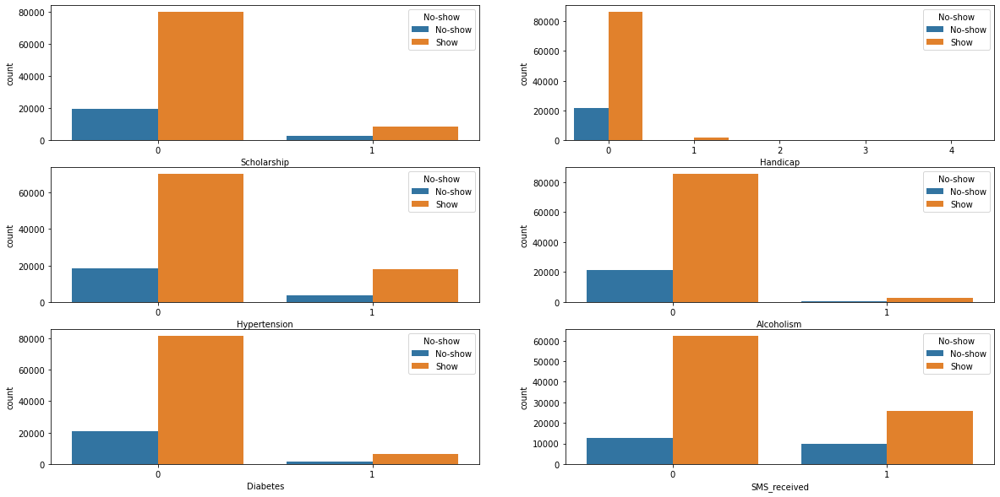

In [37]:
# Multiple columns with No-show Status
plt.figure(figsize=(20,10));
plt.subplot(3,2,1)
sns.countplot(df['Scholarship'],hue=df['No-show'])
plt.subplot(3,2,2)
sns.countplot(df['Handicap'],hue=df['No-show'])
plt.subplot(3,2,3)
sns.countplot(df['Hypertension'],hue=df['No-show'])
plt.subplot(3,2,4)
sns.countplot(df['Alcoholism'],hue=df['No-show'])
plt.subplot(3,2,5)
sns.countplot(df['Diabetes'],hue=df['No-show'])
plt.subplot(3,2,6)
sns.countplot(df['SMS_received'],hue=df['No-show'])
plt.show()

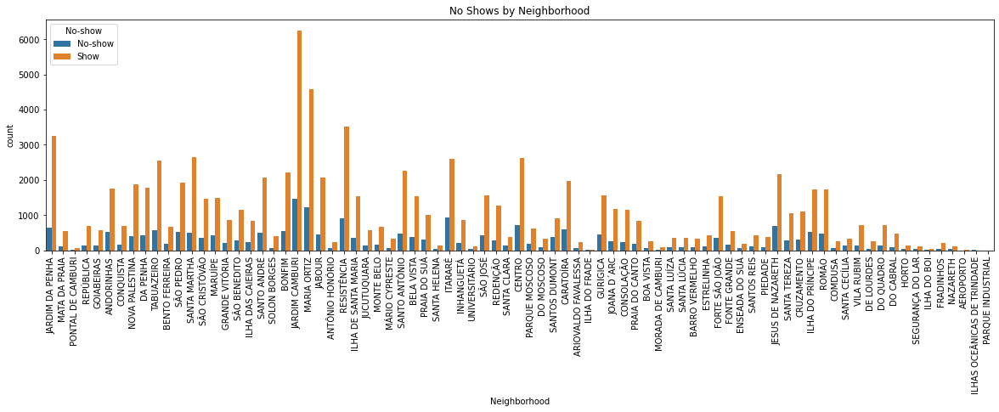

In [38]:
plt.figure(figsize=(20, 5))
sns.countplot(x=df['Neighborhood'], hue=df['No-show']);
plt.xticks(rotation=90);
plt.title('No Shows by Neighborhood');

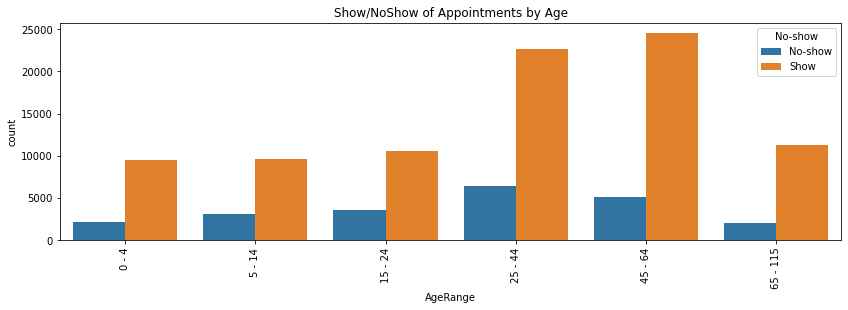

In [39]:
df['AgeRange'] = pd.cut(df.Age, labels = ['0 - 4','5 - 14','15 - 24', '25 - 44',
                            '45 - 64', '65 - 115'], bins = [-1,5,15,25,45,65,116])
plt.figure(figsize=(14,4))
plt.xticks(rotation=90)
ax = sns.countplot(x=df.AgeRange, hue=df['No-show'])
ax.set_title("Show/NoShow of Appointments by Age")
plt.show()

In [40]:
df['NoShowRate'] = np.where(df['No-show']=='No show',1,0)
df.head()

,PatientId,AppointmentID,Gender,ScheduledDay,AppointmentDay,Age,Neighborhood,Scholarship,Hypertension,Diabetes,Alcoholism,Handicap,SMS_received,No-show,WaitingDays,Appointment_WeekDay,Schedule_WeekDay,AgeRange,NoShowRate
0,2.987250e+13,5642903,F,2016-04-29 14:38:00,2016-04-28 20:00:00,62,JARDIM DA PENHA,0,1,0,0,0,0,Show,-1 days +05:22:00,Thursday,Friday,45 - 64,0
1,5.589980e+14,5642503,M,2016-04-29 12:08:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,0,0,0,0,0,Show,-1 days +07:52:00,Thursday,Friday,45 - 64,0
2,4.262960e+12,5642549,F,2016-04-29 12:19:00,2016-04-28 20:00:00,62,MATA DA PRAIA,0,0,0,0,0,0,Show,-1 days +07:41:00,Thursday,Friday,45 - 64,0
3,8.679510e+11,5642828,F,2016-04-29 13:29:00,2016-04-28 20:00:00,8,PONTAL DE CAMBURI,0,0,0,0,0,0,Show,-1 days +06:31:00,Thursday,Friday,5 - 14,0
4,8.841190e+12,5642494,F,2016-04-29 12:07:00,2016-04-28 20:00:00,56,JARDIM DA PENHA,0,1,1,0,0,0,Show,-1 days +07:53:00,Thursday,Friday,45 - 64,0


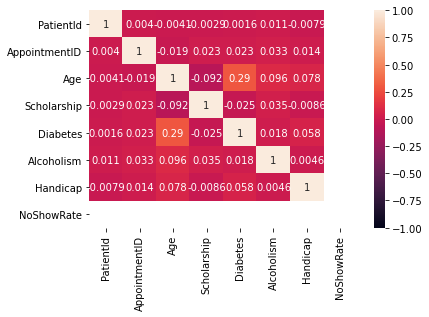

In [41]:
sns.heatmap(df.corr(),annot=True,vmin=-1,vmax=1);

In [42]:
df.pivot_table(index = 'Age', columns = 'No-show')

Alcoholism           AppointmentID               Diabetes            \
No-show    No-show      Show       No-show          Show  No-show      Show   
Age                                                                           
0              0.0  0.000000  5.641653e+06  5.677924e+06  0.00000  0.000000   
1              0.0  0.000000  5.634778e+06  5.688527e+06  0.00241  0.000000   
2              0.0  0.000000  5.643469e+06  5.688519e+06  0.00000  0.000732   
3              0.0  0.000000  5.642881e+06  5.685949e+06  0.00000  0.000000   
4              0.0  0.000983  5.645592e+06  5.685751e+06  0.00000  0.000983   
..             ...       ...           ...           ...      ...       ...   
98             0.0  0.000000  5.588126e+06  5.559402e+06  0.00000  0.400000   
99             NaN  0.000000           NaN  5.775674e+06      NaN  1.000000   
100            NaN  0.000000           NaN  5.721921e+06      NaN  0.000000   
102            NaN  0.000000           NaN  5.701660e+06      NaN  0.000000   
115            0.0  0.000000  5.654456e+06  5.730744e+06  0.00000  0.000000   

         Handicap           NoShowRate          PatientId                \
No-show   No-show      Show    No-show Show       No-show          Show   
Age                                                                       
0        0.000000  0.000345        0.0  0.0  1.474478e+14  1.553250e+14   
1        0.000000  0.000538        0.0  0.0  1.478282e+14  1.602993e+14   
2        0.000000  0.000732        0.0  0.0  1.637034e+14  1.401013e+14   
3        0.000000  0.000000        0.0  0.0  1.475118e+14  1.441559e+14   
4        0.007092  0.006883        0.0  0.0  1.581108e+14  1.493441e+14   
..            ...       ...        ...  ...           ...           ...   
98       0.000000  0.000000        0.0  0.0  1.294690e+14  8.467227e+13   
99            NaN  0.000000        NaN  0.0           NaN  3.661577e+10   
100           NaN  0.500000        NaN  0.0           NaN  1.891398e+13   
102           NaN  0.000000        NaN  0.0           NaN  4.882646e+14   
115      1.000000  0.500000        0.0  0.0  3.196320e+13  3.900991e+14   

        Scholarship            
No-show     No-show      Show  
Age                            
0          0.010955  0.015517  
1          0.028916  0.037675  
2          0.059524  0.076135  
3          0.086643  0.090615  
4          0.081560  0.118977  
..              ...       ...  
98         0.000000  0.000000  
99              NaN  0.000000  
100             NaN  0.000000  
102             NaN  0.000000  
115        0.000000  0.000000  

[103 rows x 14 columns]

In [43]:
df.pivot_table(index = 'WaitingDays', columns = 'No-show')

Age       Alcoholism      AppointmentID             \
No-show           No-show  Show    No-show Show       No-show       Show   
WaitingDays                                                                
-7 days +10:11:00    81.0   NaN        0.0  NaN     5686628.0        NaN   
-2 days +09:10:00    19.0   NaN        0.0  NaN     5715660.0        NaN   
-2 days +10:17:00    22.0   NaN        0.0  NaN     5664962.0        NaN   
-2 days +13:09:00    38.0   NaN        0.0  NaN     5679978.0        NaN   
-2 days +17:10:00     7.0   NaN        0.0  NaN     5655637.0        NaN   
...                   ...   ...        ...  ...           ...        ...   
178 days 14:15:00     NaN  63.0        NaN  0.0           NaN  5134249.0   
178 days 14:16:00    73.0  66.5        0.0  0.0     5134233.0  5134241.0   
178 days 14:17:00     NaN  74.5        NaN  0.0           NaN  5134225.5   
178 days 14:18:00     NaN  48.0        NaN  0.0           NaN  5134220.0   
178 days 14:20:00    27.0   NaN        0.0  NaN     5134197.0        NaN   

                  Diabetes      Handicap      NoShowRate          PatientId  \
No-show            No-show Show  No-show Show    No-show Show       No-show   
WaitingDays                                                                   
-7 days +10:11:00      0.0  NaN      0.0  NaN        0.0  NaN  9.982320e+14   
-2 days +09:10:00      0.0  NaN      1.0  NaN        0.0  NaN  7.896290e+12   
-2 days +10:17:00      0.0  NaN      0.0  NaN        0.0  NaN  2.425230e+13   
-2 days +13:09:00      0.0  NaN      1.0  NaN        0.0  NaN  7.839270e+12   
-2 days +17:10:00      0.0  NaN      0.0  NaN        0.0  NaN  3.787480e+12   
...                    ...  ...      ...  ...        ...  ...           ...   
178 days 14:15:00      NaN  1.0      NaN  0.0        NaN  0.0           NaN   
178 days 14:16:00      1.0  1.0      1.0  0.0        0.0  0.0  3.512660e+14   
178 days 14:17:00      NaN  1.0      NaN  0.0        NaN  0.0           NaN   
178 days 14:18:00      NaN  1.0      NaN  0.0        NaN  0.0           NaN   
178 days 14:20:00      0.0  NaN      0.0  NaN        0.0  NaN  1.216590e+12   

                                Scholarship       
No-show                    Show     No-show Show  
WaitingDays                                       
-7 days +10:11:00           NaN         0.0  NaN  
-2 days +09:10:00           NaN         0.0  NaN  
-2 days +10:17:00           NaN         0.0  NaN  
-2 days +13:09:00           NaN         0.0  NaN  
-2 days +17:10:00           NaN         0.0  NaN  
...                         ...         ...  ...  
178 days 14:15:00  2.547550e+14         NaN  0.0  
178 days 14:16:00  5.138292e+14         0.0  0.0  
178 days 14:17:00  2.387947e+14         NaN  0.0  
178 days 14:18:00  3.189960e+13         NaN  0.0  
178 days 14:20:00           NaN         1.0  NaN  

[24594 rows x 16 columns]

In [44]:
df.pivot_table(index = 'Gender', columns = 'No-show')

Age            Alcoholism           AppointmentID                \
No-show   No-show       Show    No-show      Show       No-show          Show   
Gender                                                                          
F        36.16219  39.591126   0.021105  0.015984  5.651340e+06  5.680199e+06   
M        30.83301  34.461372   0.047767  0.057102  5.653994e+06  5.682868e+06   

         Diabetes            Handicap           NoShowRate          PatientId  \
No-show   No-show      Show   No-show      Show    No-show Show       No-show   
Gender                                                                          
F        0.069686  0.080164  0.018569  0.019792          0    0  1.452126e+14   
M        0.053463  0.062141  0.023560  0.028196          0    0  1.496610e+14   

                      Scholarship            
No-show          Show     No-show      Show  
Gender                                       
F        1.462122e+14    0.144306  0.117862  
M        1.503964e+14    0.061100  0.049609